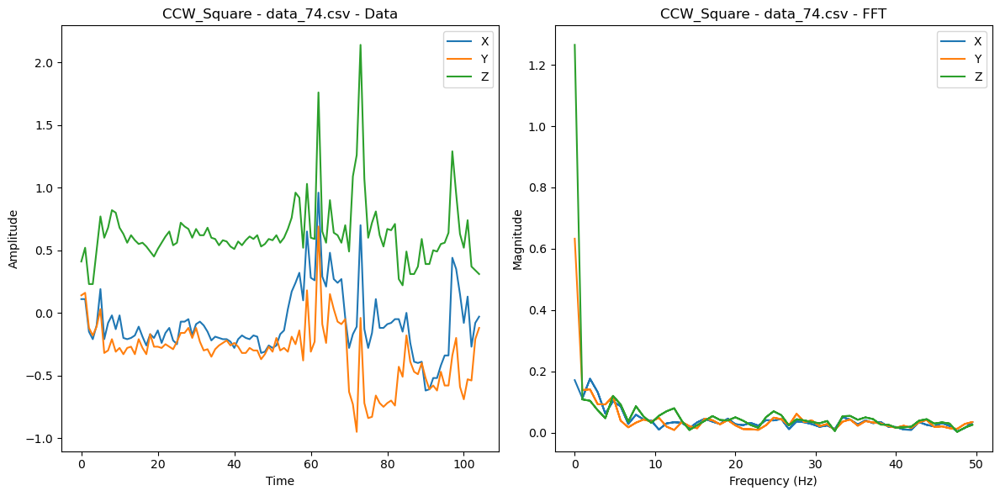

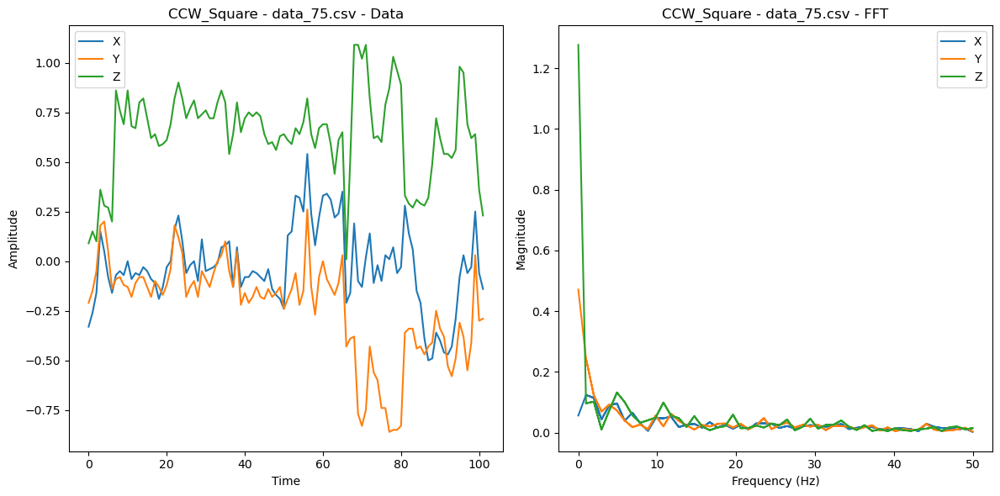

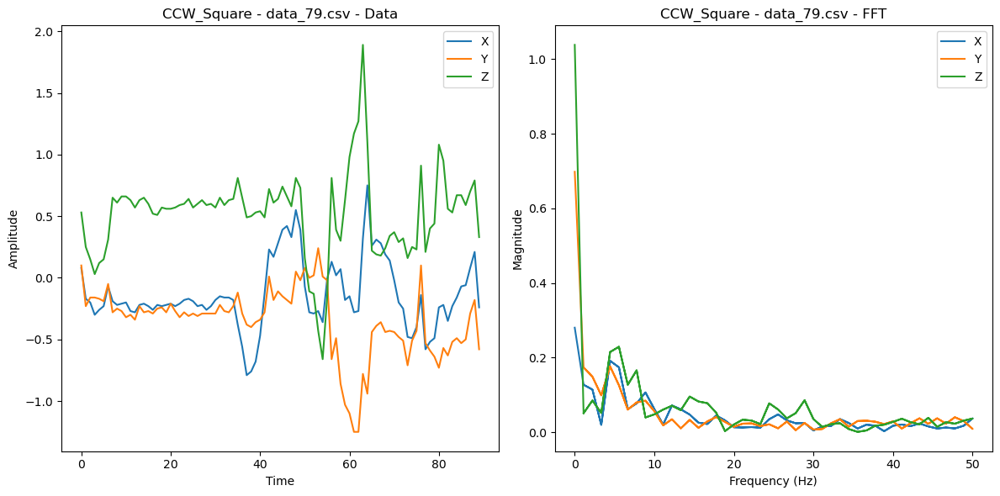

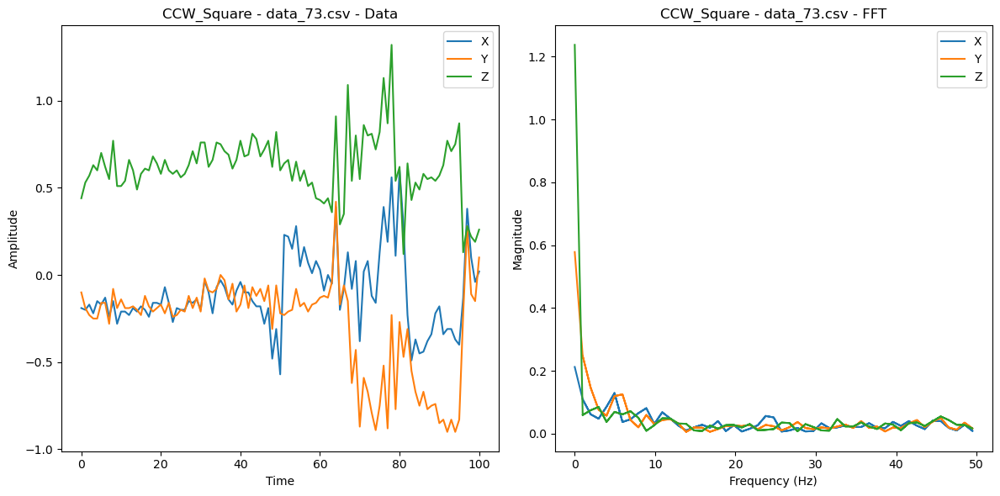

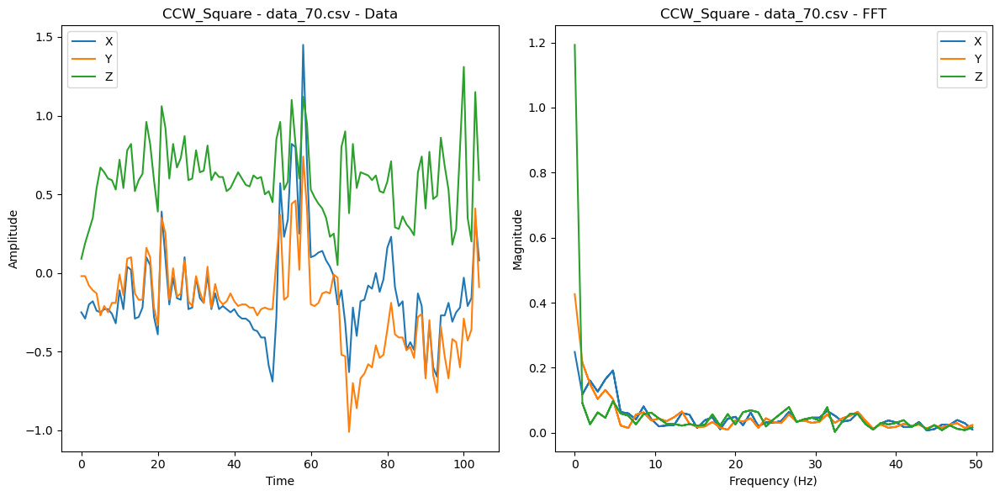

...

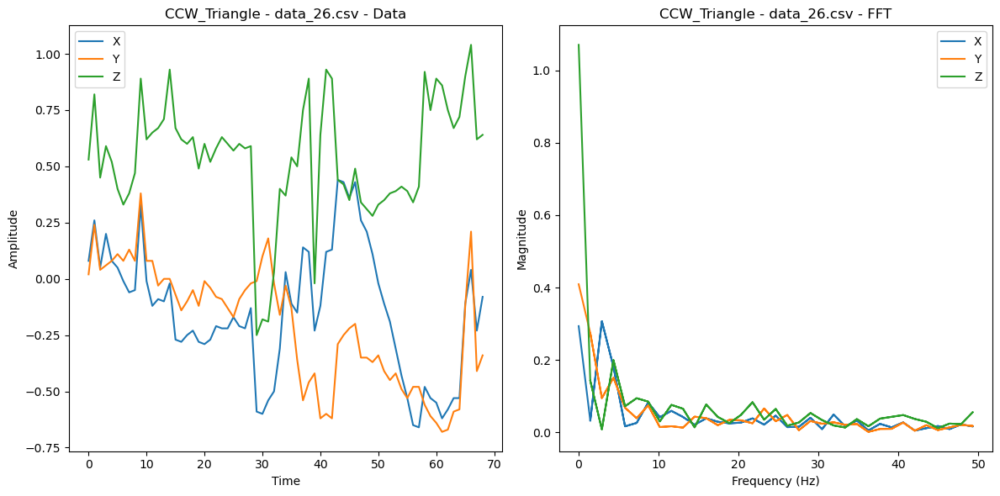

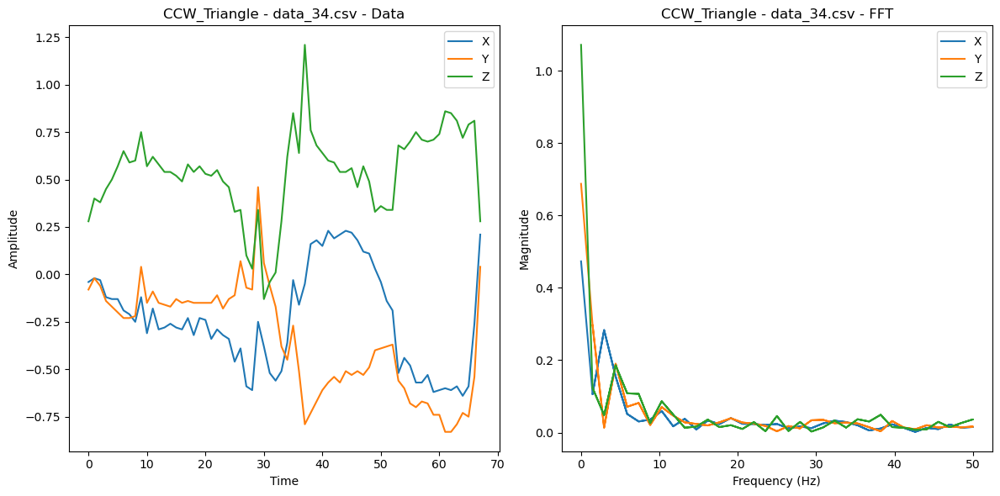

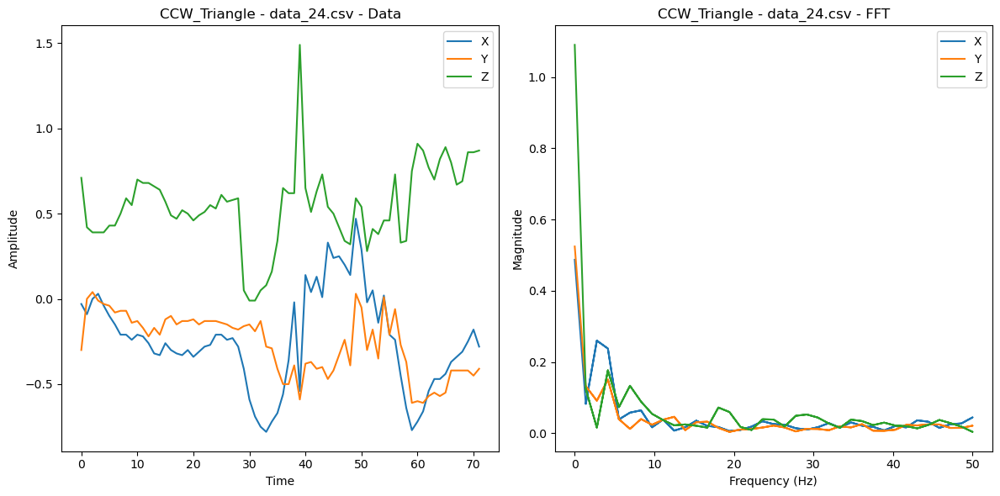

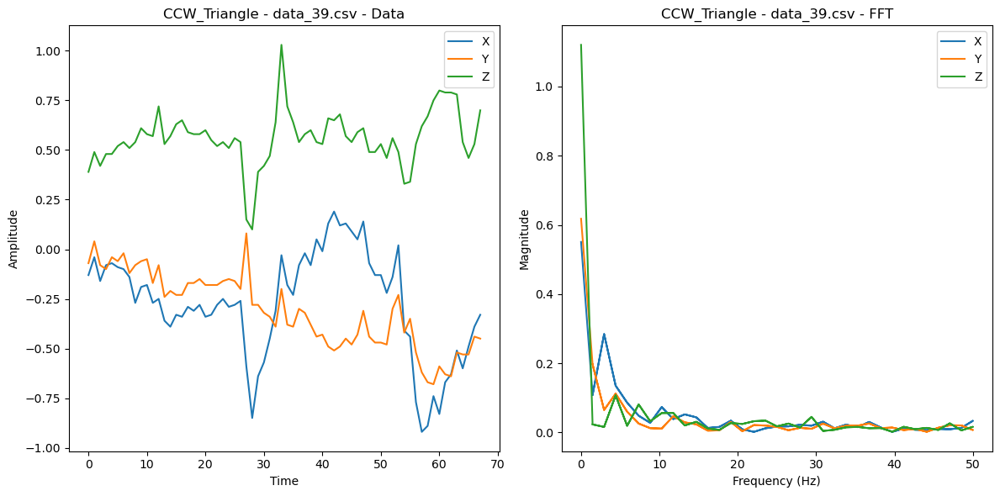

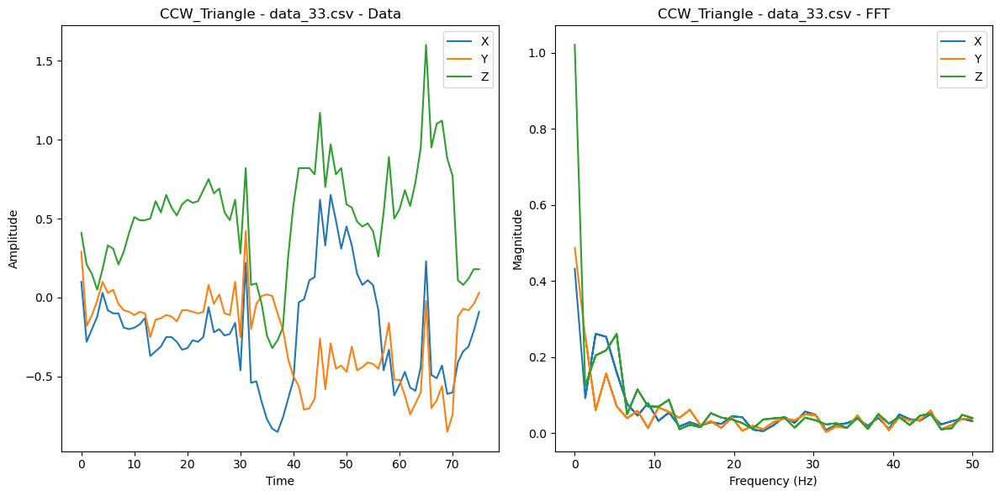

In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def load_files_from_folder(folder_path):
    # List all CSV files in the folder
    csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]
    
    # Create a list to store dataframes and filenames
    dataframes = []
    filenames = []

    # Read each CSV file and store the dataframe and filename in the lists
    for file in csv_files:
        file_path = os.path.join(folder_path, file)
        df = pd.read_csv(file_path)
        dataframes.append(df)
        filenames.append(file)
    
    return dataframes, filenames

def plot_data_and_fft(dataframes, filenames, folder_name):
    num_files = len(dataframes)
    for i in range(num_files):
        df = dataframes[i]
        filename = filenames[i]
        
        plt.figure(figsize=(12, 6))

        # Plot original data
        plt.subplot(1, 2, 1)
        plt.plot(df['X'], label='X')
        plt.plot(df['Y'], label='Y')
        plt.plot(df['Z'], label='Z')
        plt.xlabel("Time")
        plt.ylabel('Amplitude')
        plt.title(f'{folder_name} - {filename} - Data')
        plt.legend()

        # Perform FFT
        fft_X = np.fft.fft(df['X'])
        fft_Y = np.fft.fft(df['Y'])
        fft_Z = np.fft.fft(df['Z'])
        freq = np.fft.fftfreq(len(df), d=1/100)

        # Plot FFT
        plt.subplot(1, 2, 2)
        plt.plot(abs(freq), 2*abs(fft_X)/len(df), label='X')
        plt.plot(abs(freq), 2*abs(fft_Y)/len(df), label='Y')
        plt.plot(abs(freq), 2*abs(fft_Z)/len(df), label='Z')
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Magnitude')
        plt.title(f'{folder_name} - {filename} - FFT')
        plt.legend()

        plt.tight_layout()
        plt.show()

def process_all_folders(base_folder_path):
    # Get all subfolders
    for folder_name in os.listdir(base_folder_path):
        folder_path = os.path.join(base_folder_path, folder_name)
        
        if os.path.isdir(folder_path):
            # Load dataframes and filenames from the current folder
            dataframes, filenames = load_files_from_folder(folder_path)
            
            if dataframes:
                # Plot data and FFT for the current folder
                plot_data_and_fft(dataframes, filenames, folder_name)


# Example usage:
base_folder_path = '/home/ettexham/Downloads/Gestures/Wasi Rahman/'
process_all_folders(base_folder_path)
